# CSDA evaluation imagery footprinting

Run this notebook from top to bottom to footprint all recognized imagery under `CSDA_eval/Data`, link acquisition footprints to evaluation sites, and write the standard footprint and summary products.

In [1]:
from pathlib import Path
from urllib.parse import quote
from collections import Counter
import importlib
import re
import sys

import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

LIB_DIR = Path('/home/pmontesa/code/csda_summaries/lib')
GEOSCI_TOOLS = Path('/home/pmontesa/code/geoscitools')
for path in (LIB_DIR, GEOSCI_TOOLS):
    if str(path) not in sys.path:
        sys.path.append(str(path))

import sensor_profiles
import csdalib
importlib.reload(sensor_profiles)
importlib.reload(csdalib)
from sensor_profiles import SENSOR_PROFILES

print(f'Loaded {len(SENSOR_PROFILES)} sensor profiles')

/panfs/ccds02/app/modules/jupyter/ilab/tensorflow-kernel/lib/python3.8/site-packages/pyproj/../../.././libtiff.so.6: version `LIBTIFF_4.6.1' not found (required by /app/jupyter/ilab/jupyter-lab/prod/lib/gdalplugins/../libgdal.so.36)
/panfs/ccds02/app/modules/jupyter/ilab/tensorflow-kernel/lib/python3.8/site-packages/pyproj/../../.././libtiff.so.6: version `LIBTIFF_4.6.1' not found (required by /app/jupyter/ilab/jupyter-lab/prod/lib/gdalplugins/../libgdal.so.36)
/panfs/ccds02/app/modules/jupyter/ilab/tensorflow-kernel/lib/python3.8/site-packages/pyproj/../../.././libtiff.so.6: version `LIBTIFF_4.6.1' not found (required by /app/jupyter/ilab/jupyter-lab/prod/lib/gdalplugins/../libgdal.so.36)
/panfs/ccds02/app/modules/jupyter/ilab/tensorflow-kernel/lib/python3.8/site-packages/pyproj/../../.././libtiff.so.6: version `LIBTIFF_4.6.1' not found (required by /app/jupyter/ilab/jupyter-lab/prod/lib/gdalplugins/../libgdal.so.36)
/panfs/ccds02/app/modules/jupyter/ilab/tensorflow-kernel/lib/python3

Loaded 8 sensor profiles


In [2]:
# Configuration: edit these paths or switches, then rerun from here.
DATA_ROOT = Path('/home/pmontesa/CSDA_eval/Data')
SITES_FILE = Path('/explore/nobackup/projects/CSDA_eval/sites/csda_sites_aoi.geojson')
OUTPUT_ROOT = Path('/explore/nobackup/projects/CSDA_eval')
FOOTPRINT_DIR = OUTPUT_ROOT / 'footprints'
SUMMARY_DIR = OUTPUT_ROOT / 'summaries'
SPREADSHEET_ID = '13MrpqFtAOqQY9WdW9lHNsqjCbG-e3VQkEDbHOGIKa6k'
SHEET_NAME = 'Requested Acquisitions'
BUFFER_METERS = 1000
DISPLAY_BUFFER_KM = 25
INCLUDE_PANCHROMATIC = True
WRITE_LATEST_COPIES = True
RUN_DATE = pd.Timestamp.today().strftime('%Y-%m-%d')

FOOTPRINT_DIR.mkdir(parents=True, exist_ok=True)
SUMMARY_DIR.mkdir(parents=True, exist_ok=True)
print(f'Data root: {DATA_ROOT}')
print(f'Run date:  {RUN_DATE}')

Data root: /home/pmontesa/CSDA_eval/Data
Run date:  2026-08-25


## Inputs and requested acquisitions

#### Read sites GeoJson
best to work downstream of this notebook that creates a GeoJSON AOI of our sites

In [3]:
sites_gdf = gpd.read_file(SITES_FILE)
if sites_gdf.crs is None:
    raise ValueError('The sites layer has no CRS')

requested_url = (
    f'https://docs.google.com/spreadsheets/d/{SPREADSHEET_ID}/gviz/tq'
    f'?tqx=out:csv&sheet={quote(SHEET_NAME)}'
)
try:
    requested_acqs = pd.read_csv(requested_url)
    requested_acqs = requested_acqs.drop(
        columns=[c for c in requested_acqs.columns if 'Unnamed:' in c]
    )
    requested_acqs['Site'] = requested_acqs['Site'].astype(str).str.rstrip()
except Exception as exc:
    print(f'Could not load requested acquisitions: {exc}')
    requested_acqs = pd.DataFrame()

print(f'Sites: {len(sites_gdf)} | CRS: {sites_gdf.crs}')
print(f'Request rows: {len(requested_acqs)}')

Sites: 218 | CRS: epsg:4326
Request rows: 77


In [4]:
# Buffer MORE for sites for display
BUF_KM_ADD_FOR_DISPLAY = 25
BUF_KM_TOTAL_FOR_DISPLAY = BUF_KM_ADD_FOR_DISPLAY #+ BUF_KM

In [5]:
sites_gdf_buf = sites_gdf.to_crs(3857).buffer(BUF_KM_ADD_FOR_DISPLAY * 1000) # add arbitrary buffer to evaluation sites for map display
sites_gdf_buf_display = gpd.GeoDataFrame(sites_gdf.drop(columns=['geometry']), geometry=sites_gdf_buf, crs=sites_gdf_buf.crs).to_crs(4326)
sites_gdf_buf_display = sites_gdf_buf_display[~(sites_gdf_buf_display.geometry.is_empty | sites_gdf_buf_display.geometry.isna())]

In [6]:
SEARCH_PATTERNS = ('*.tif', '*.TIF', '*.jp2', '*.JP2', '*.json', '*.geojson')
SKIP_PATTERNS = (
    r'-request\.json$', r'_manifest\.json$', r'README',
    r'^(CCS|CLD|DCL|HAZ|MSK|GFP)_',
    r'_TCI\.(tif|jpeg)$', r'_PCL\.tif$'
)

def is_noise(path):
    name = Path(path).name
    return any(re.search(pattern, name, re.IGNORECASE) for pattern in SKIP_PATTERNS)

candidate_files = sorted({
    str(path) for pattern in SEARCH_PATTERNS
    for path in DATA_ROOT.rglob(pattern)
    if path.is_file() and not is_noise(path)
})
detected = [(path, csdalib.detect_vendor(path)) for path in candidate_files]
detected = [(path, profile) for path, profile in detected if profile]
unmatched = [path for path in candidate_files if not csdalib.detect_vendor(path)]

print(f'Candidates: {len(candidate_files)}')
print(f'Recognized: {len(detected)} | Unmatched: {len(unmatched)}')
print('Recognized files by profile:')
for profile, count in Counter(profile for _, profile in detected).most_common():
    print(f'  {profile:20s} {count:6d}')

if unmatched:
    print('First unmatched files:')
    for path in unmatched[:10]:
        print(f'  {path}')

Candidates: 4978
Recognized: 4961 | Unmatched: 17
Recognized files by profile:
  airbus_dimap           2940
  legion                 1234
  satellogic              363
  pixxel                  249
  pixxel_fpt               88
  tanager                  87
First unmatched files:
  /home/pmontesa/CSDA_eval/Data/Maxar/Worldview/6919410355934334290.tif
  /home/pmontesa/CSDA_eval/Data/Maxar/Worldview/Baotou/Baotou_04Apr25/6919410355934334290.tif
  /home/pmontesa/CSDA_eval/Data/Maxar/Worldview/Baotou/Baotou_04Apr25/6919410355934334290_1.tif
  /home/pmontesa/CSDA_eval/Data/Maxar/Worldview/Baotou/Baotou_21Mar25/6919384648513018265.tif
  /home/pmontesa/CSDA_eval/Data/Maxar/Worldview/Baotou/Baotou_21Mar25/6919384648513018265_1.tif
  /home/pmontesa/CSDA_eval/Data/Maxar/Worldview/Boston/02Jan25/6919823211316346812_2.tif
  /home/pmontesa/CSDA_eval/Data/Maxar/Worldview/Boston/02Jan25/6919823211316346812_4.tif
  /home/pmontesa/CSDA_eval/Data/Maxar/Worldview/Boston/02Jan25/6919823211316346812_5.tif

## Scene footprints

In [7]:
files_to_process = [path for path, _ in detected]
footprint_gdf = csdalib.process_files(
    files_to_process, profiles=SENSOR_PROFILES
)

if footprint_gdf.empty:
    raise RuntimeError('No footprints were produced')

footprint_gdf = footprint_gdf[footprint_gdf.geometry.notna()].copy()
footprint_gdf['metadata_path'] = footprint_gdf['metadata_path'].fillna('')
print(f'Produced {len(footprint_gdf)} scene footprints')
print(footprint_gdf.groupby(['affiliation', 'sensor'], dropna=False).size().sort_values(ascending=False).head(20))

Error processing IMG_PNEO4_HD_202510051040574_PMS_ORT_PWOI_000501695_1_1_F_1_RGBN_R1C1.TIF: /home/pmontesa/CSDA_eval/Data/Airbus/HD15/000501695_1_1_HD_A/IMG_01_PNEO4_PMS/IMG_PNEO4_HD_202510051040574_PMS_ORT_PWOI_000501695_1_1_F_1_RGBN_R1C1.TIF: TIFFReadDirectory:Failed to read directory at offset 1677721608
Produced 4827 scene footprints
affiliation  sensor   
Airbus       PNEO3        993
             PNEO4        885
             PHR1A        405
Maxar        LG01         380
Airbus       SPOT6        336
             PHR1B        320
Maxar        LG03         276
             LG02         225
             LG04         141
             LG05         137
Pixxel       FF03          91
             FF01          87
Maxar        LG06          75
Pixxel       FF02          71
Satellogic   SN27          60
             SN41          54
Planet       Tanager-1     44
Satellogic   SN31          42
             SN50          42
             SN10          31
dtype: int64


In [8]:
# Compact health checks: useful signals, without the exploratory notebook clutter.
fallback_mask = footprint_gdf['acquisition_id_source'].eq('fallback')
print(f'Fallback IDs: {fallback_mask.sum()} | Missing metadata: {(~footprint_gdf["has_metadata"]).sum()}')
print(f'Unique acquisition IDs: {footprint_gdf["acquisition_id"].nunique()}')

duplicate_ids = (
    footprint_gdf.groupby('acquisition_id')['metadata_path']
    .nunique()
    .loc[lambda values: values > 1]
)
if len(duplicate_ids):
    print('IDs used by multiple metadata deliveries (kept separate below):')
    print(duplicate_ids.head(20))

scene_fn = FOOTPRINT_DIR / f'footprints_CSDA_eval_SCENES_{RUN_DATE}.gpkg'
csdalib.prepare_gdf_for_export(footprint_gdf).to_file(scene_fn, driver='GPKG')
print(f'Wrote {scene_fn}')

Fallback IDs: 121 | Missing metadata: 122
Unique acquisition IDs: 454
IDs used by multiple metadata deliveries (kept separate below):
acquisition_id
20210215_090944_SN10_L1D_MS_None    2
ACQ_PNEO3_00507100187587            2
ACQ_PNEO3_00517800223246            4
ACQ_PNEO3_00817800762442            4
ACQ_PNEO3_01417802079177            4
ACQ_PNEO3_01925603746292            2
ACQ_PNEO3_02025204087867            4
ACQ_PNEO3_02825206722555            4
ACQ_PNEO3_03325208391179            4
ACQ_PNEO3_03633009426867            2
ACQ_PNEO3_04810413458023            4
ACQ_PNEO3_04818213535232            2
ACQ_PNEO3_05621316412341            2
ACQ_PNEO3_06125201861942            6
ACQ_PNEO3_06127601890757            2
ACQ_PNEO3_06201502035586            2
ACQ_PNEO3_06201502035587            2
ACQ_PNEO3_06209502129560            2
ACQ_PNEO3_06216902216041            2
ACQ_PNEO3_06217802226700            6
Name: metadata_path, dtype: int64
Wrote /explore/nobackup/projects/CSDA_eval/footprints/foo

In [9]:
# Aggregate scene footprints to acquisition footprints before spatial linking.
group_fields = ['acquisition_id', 'metadata_path']
footprint_gdf_acquisitions = (
    footprint_gdf.to_crs(3857)
    .dissolve(by=group_fields, as_index=False, aggfunc='first')
)

footprint_gdf_acquisitions_sites, acq_site_mapping = csdalib.link_acquisitions_to_sites(
    footprint_gdf_acquisitions,
    sites_gdf.to_crs(3857),
    buffer_distance=BUFFER_METERS,
    site_name_col='Site Name'
)

site_counts = footprint_gdf_acquisitions_sites['Site_Primary'].value_counts(dropna=False)

acquisition_fn = FOOTPRINT_DIR / f'footprints_CSDA_eval_ACQUISITIONS_{RUN_DATE}.gpkg'
csdalib.prepare_gdf_for_export(footprint_gdf_acquisitions_sites).to_file(
    acquisition_fn, driver='GPKG'
)
print(f'Acquisition rows: {len(footprint_gdf_acquisitions_sites)}')
print(f'Wrote {acquisition_fn}')

This may indicate duplicate acquisitions in input data

Summary:
  Total acquisitions: 857
  Acquisitions intersecting sites: 811
  Acquisitions NOT intersecting sites: 46
  Single-site acquisitions: 761
  Multi-site acquisitions (2+ sites): 50
  Acquisitions covering 3+ sites: 17
Converting column 'sites' from list to string
Acquisition rows: 857
Wrote /explore/nobackup/projects/CSDA_eval/footprints/footprints_CSDA_eval_ACQUISITIONS_2026-08-25.gpkg


In [35]:
acq_site_mapping

,acquisition_id,sites,num_sites,Site_Primary,Site_Secondary,Site_Tertiary
0,20210202_090141_SN10_L1D_MS_None,[PICS Libya-4],1,PICS Libya-4,None,None
1,20210205_091047_SN10_L1D_MS_27152,[PICS Libya-4],1,PICS Libya-4,None,None
2,20210212_090048_SN10_L1D_MS_27152,[PICS Libya-4],1,PICS Libya-4,None,None
3,20210215_090944_SN10_L1D_MS_None,[PICS Libya-4],1,PICS Libya-4,None,None
4,20210303_111934_SN16_L1D_MS_28280,[Casablanca],1,Casablanca,None,None
...,...,...,...,...,...,...
416,FF03_20260302_00501045_0000006356,[Navarre Causeway],1,Navarre Causeway,None,None
417,FF03_20260319_00501045_0000007394,[WLEF],1,WLEF,None,None
418,FF03_20260319_00501045_0000007412,[Railroad Valley],1,Railroad Valley,None,None
419,FF03_20260320_00501045_0000007409,[WLEF],1,WLEF,None,None


In [10]:
# Compact diagnostics: duplicate-ID rows.
collision_rows = footprint_gdf_acquisitions_sites[
    footprint_gdf_acquisitions_sites['acquisition_id'].isin(duplicate_ids.index)
][['acquisition_id', 'metadata_path', 'Site_Primary', 'num_sites']]
if not collision_rows.empty:
    display(collision_rows.sort_values(['acquisition_id', 'metadata_path']))

,acquisition_id,metadata_path,Site_Primary,num_sites
3,20210215_090944_SN10_L1D_MS_None,/home/pmontesa/CSDA_eval/Data/Satellogic/SN10/...,PICS Libya-4,1
4,20210215_090944_SN10_L1D_MS_None,/home/pmontesa/CSDA_eval/Data/Satellogic/SN10/...,PICS Libya-4,1
83,ACQ_PNEO3_00507100187587,/home/pmontesa/CSDA_eval/Data/Airbus/PNEO3_202...,Baotou,1
84,ACQ_PNEO3_00507100187587,/home/pmontesa/CSDA_eval/Data/Airbus/PNEO3_202...,Baotou,1
85,ACQ_PNEO3_00517800223246,/home/pmontesa/CSDA_eval/Data/Airbus/PNEO3_202...,PICS Libya-4,1
...,...,...,...,...
837,FF03_20251118_00501045_0000002779,/home/pmontesa/CSDA_eval/Data/Pixxel/V3/FF03_2...,Valencia,1
850,FF03_20260319_00501045_0000007394,/home/pmontesa/CSDA_eval/Data/Pixxel/V3/FF03_7...,WLEF,1
851,FF03_20260319_00501045_0000007394,/home/pmontesa/CSDA_eval/Data/Pixxel/V3/FF03_7...,WLEF,1
853,FF03_20260320_00501045_0000007409,/home/pmontesa/CSDA_eval/Data/Pixxel/V3/FF03_7...,WLEF,1


## Summary tables and final products

In [32]:
summary_input = footprint_gdf_acquisitions_sites.copy()
if not INCLUDE_PANCHROMATIC:
    summary_input = summary_input[summary_input['image_type'].ne('P')]

# Match the old workflow's exclusion of acquisitions outside evaluation sites.
summary_input = summary_input[summary_input['Site_Primary'].ne('Not CSDA Eval Site')]
summary_mapping = acq_site_mapping.copy()
if 'sites' in summary_mapping.columns:
    summary_mapping['sites'] = summary_mapping['sites'].apply(
        lambda values: [value for value in values if value != 'Not CSDA Eval Site']
    )
    summary_mapping = summary_mapping[summary_mapping['sites'].str.len().gt(0)]

summaries = csdalib.create_comprehensive_summary(
    summary_input, summary_mapping,
    site_name_col='Site_Primary', date_col='acquisition_datetime'
)
site_summary = summaries['by_site']
sensor_summary = summaries['by_sensor']
affiliation_summary = summaries['by_affiliation']
constellation_summary = summaries['by_constellation']
multi_site = summaries['multi_site_acquisitions']
all_site_associations = summaries['by_site_all_associations']

if requested_acqs.empty:
    final_summary = site_summary.copy()
    final_summary['Acquisitions Requested'] = 0
else:
    actual = site_summary.groupby(
        ['Site_Primary', 'affiliation', 'constellation', 'sensor'],
        as_index=False, dropna=False
    )['acquisition_count'].sum()
    final_summary = actual.merge(
        requested_acqs,
        left_on=['Site_Primary', 'affiliation', 'constellation', 'sensor'],
        right_on=['Site', 'affiliation', 'constellation', 'sensor'],
        how='outer'
    )

for column in ('acquisition_count', 'Acquisitions Requested'):
    if column not in final_summary:
        final_summary[column] = 0
    final_summary[column] = final_summary[column].fillna(0).astype(int)
final_summary['Acquisitions Remaining'] = (
    final_summary['Acquisitions Requested'] - final_summary['acquisition_count']
).clip(lower=0)

summary_fn = SUMMARY_DIR / f'CSDA_eval_sites_footprint_summary_MS_{RUN_DATE}.csv'
final_summary.to_csv(summary_fn, index=False)
print(f'Wrote {summary_fn}')
display(final_summary.head(20))


Summary of acquisitions at CSDA Evaluation Sites
Total Affiliations:             5
Total Constellations:           7
Total Evaluation Sites:        31
Total Acquisitions:            421
----------------------------------------------------------------------

Breakdown by Affiliation:
  Airbus                  184 acquisitions
  Pixxel                  106 acquisitions
  Satellogic               55 acquisitions
  Maxar                    54 acquisitions
  Planet                   22 acquisitions

Breakdown by Constellation:
  Pixxel/Firefly                           106 acquisitions
  Airbus/Pleiades Neo                       80 acquisitions
  Airbus/Pleiades                           72 acquisitions
  Satellogic/Aleph-1                            55 acquisitions
  Maxar/Legion                             54 acquisitions
  Airbus/SPOT                               32 acquisitions
  Planet/Tanager                            22 acquisitions

Wrote /explore/nobackup/projects/CSDA_eval/summ

,Site_Primary,affiliation,constellation,sensor,acquisition_count,Site,Acquisitions Requested,Product,Request Date,Acquisition Date,Science Team Received,Acquisitions Remaining
0,AZ Maricopa Pinal,Airbus,Pleiades,PHR1A,6,NaN,0,NaN,NaN,NaN,NaN,0
1,Albuquerque,Airbus,Pleiades,PHR1A,4,NaN,0,NaN,NaN,NaN,NaN,0
2,Albuquerque,Airbus,Pleiades Neo,PNEO3,2,NaN,0,NaN,NaN,NaN,NaN,0
3,Albuquerque,Airbus,Pleiades Neo,PNEO4,2,NaN,0,NaN,NaN,NaN,NaN,0
4,Albuquerque,Airbus,SPOT,SPOT6,6,NaN,0,NaN,NaN,NaN,NaN,0
5,Albuquerque,Pixxel,Firefly,FF01,4,Albuquerque,5,L9 OLI-2 bandset,NaN,NaN,NaN,1
6,Albuquerque,Pixxel,Firefly,FF02,2,NaN,0,NaN,NaN,NaN,NaN,0
7,Albuquerque,Pixxel,Firefly,FF03,2,NaN,0,NaN,NaN,NaN,NaN,0
8,Albuquerque,Satellogic,Aleph-1,SN31,1,NaN,0,NaN,NaN,NaN,NaN,0
9,Albuquerque,Satellogic,Aleph-1,SN48,1,NaN,0,NaN,NaN,NaN,NaN,0


In [ ]:
if WRITE_LATEST_COPIES:
    for directory in (FOOTPRINT_DIR, SUMMARY_DIR):
        latest = csdalib.copy_all_latest_files(directory, extensions=['csv', 'gpkg'])
        print(f'{directory}: {len(latest)} latest files refreshed')

print('Done.')
print(f'Scenes:       {scene_fn}')
print(f'Acquisitions: {acquisition_fn}')
print(f'Summary:      {summary_fn}')

In [ ]:
# Compact diagnostics: site counts and duplicate-ID rows.
print(site_counts.head(15))

collision_rows = footprint_gdf_acquisitions_sites[
    footprint_gdf_acquisitions_sites['acquisition_id'].isin(duplicate_ids.index)
][['acquisition_id', 'metadata_path', 'Site_Primary', 'num_sites']]
if not collision_rows.empty:
    display(collision_rows.sort_values(['acquisition_id', 'metadata_path']))

In [37]:
importlib.reload(csdalib)

<module 'csdalib' from '/home/pmontesa/code/csda_summaries/lib/csdalib.py'>

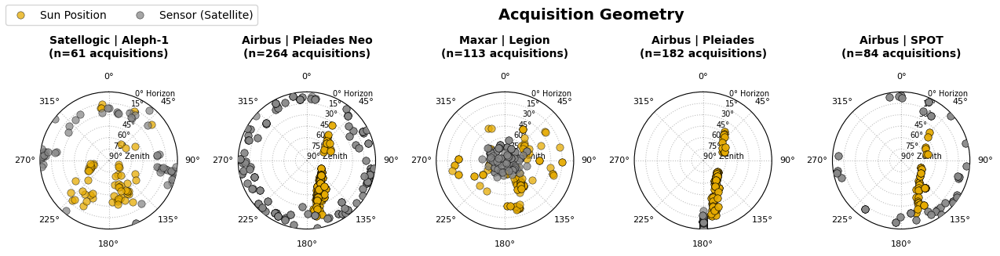

In [21]:
csdalib.plot_skyplots_by_site_and_sensor(footprint_gdf_acquisitions_sites, sensor_col='constellation', site_col='affiliation')

## Map footprints

In [22]:
# SITE_LIST_EVAL_LEGION = ['PICS Libya-4','Sapporo','Boston','Belo Horizonte','Baotou','Melbourne','Casablanca','Salon-de-Provence']
# SITE_LIST_EVAL_AIRBUS = ['PICS Libya-4','Albuquerque','London','La Crau','Etang de Berre','Gobabeb','Boston','Baotou','Railroad Valley','PICS Algeria-3','Phoenix','Melbourne','Salon-de-Provence','Piedmont','AZ Maricopa Pinal']

## Constellation-group site coverage maps

The next cell automatically plots every sensor group present in the processed acquisitions. New sensor groups require no notebook edits.

constellation groups to plot: Aleph-1, Firefly, Legion, Pleiades, Pleiades Neo, SPOT, Tanager


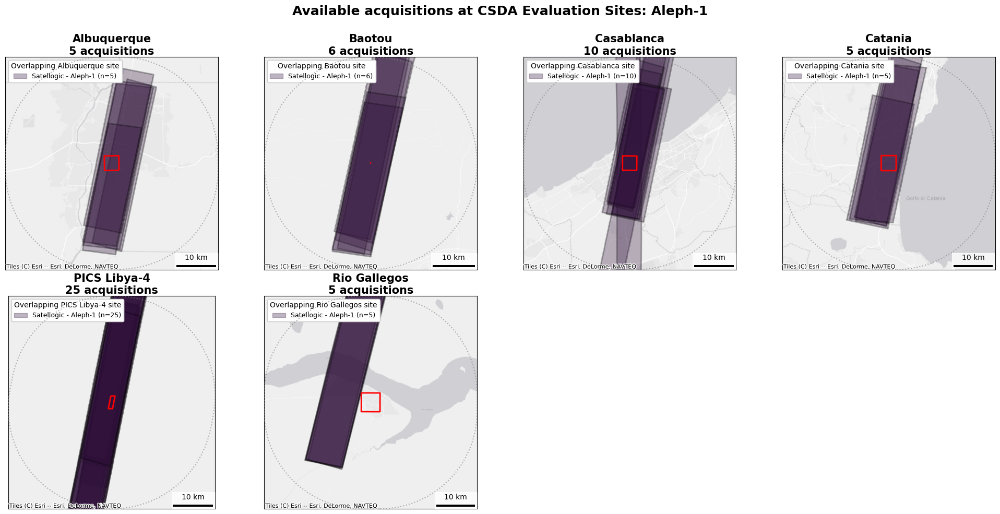

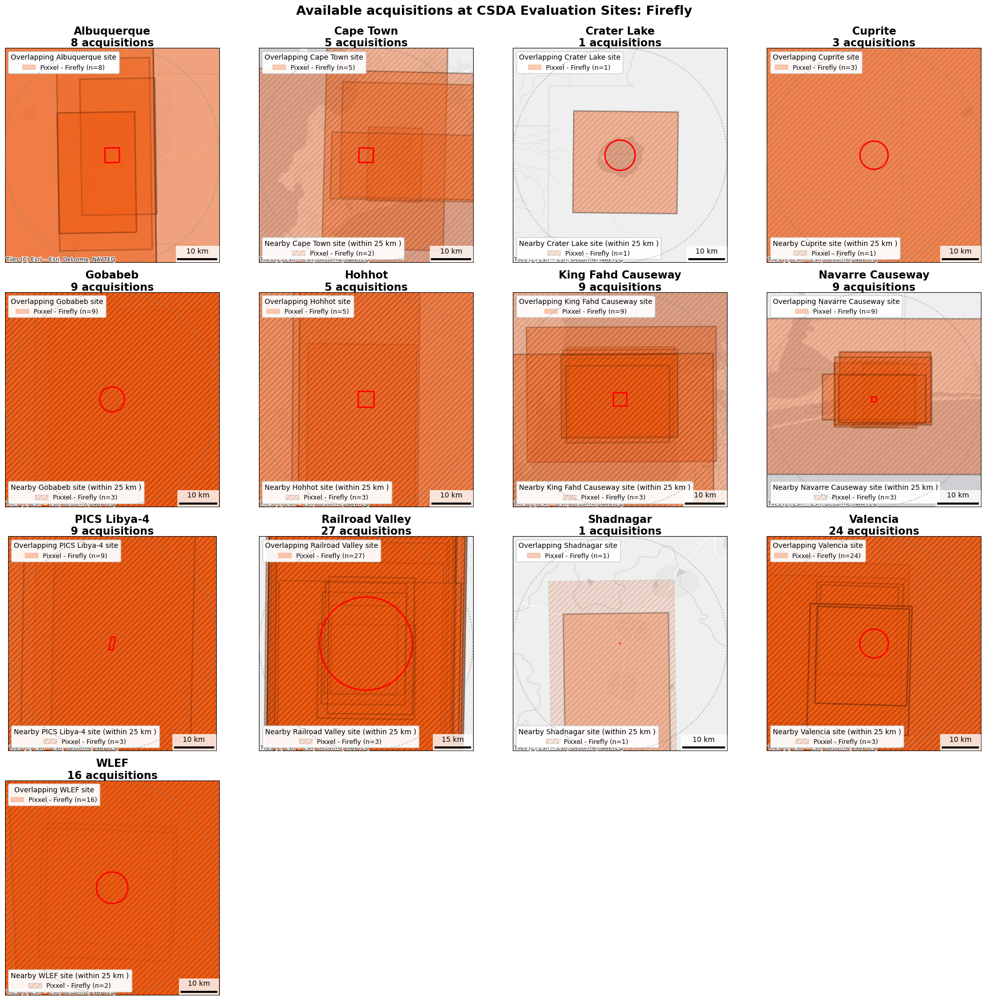

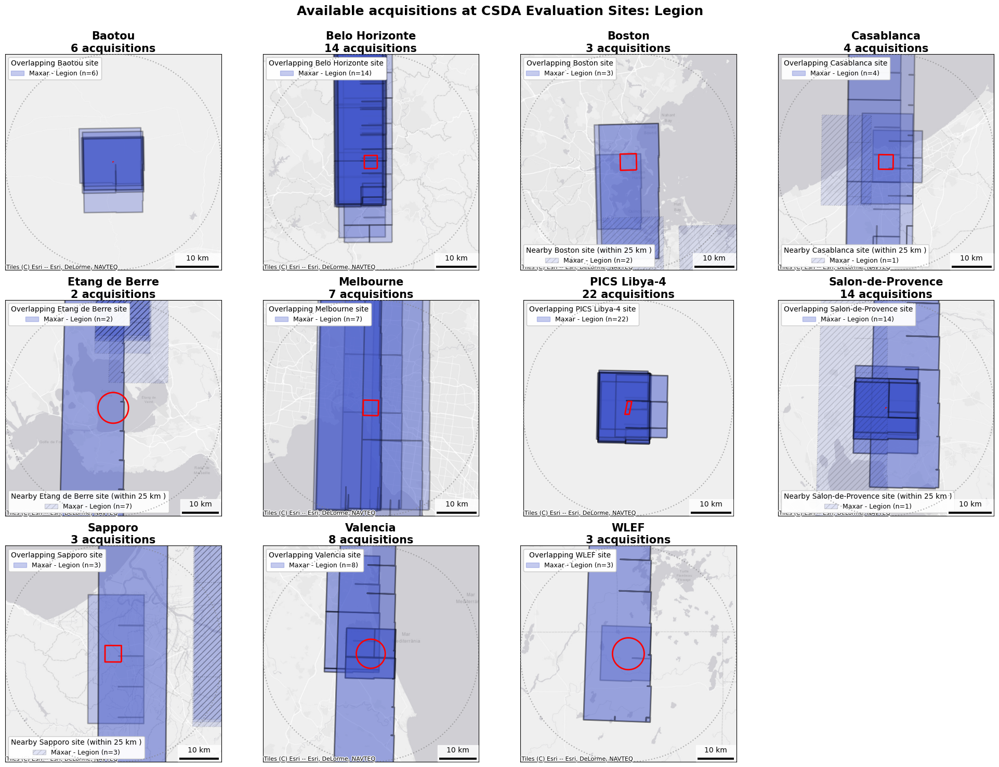

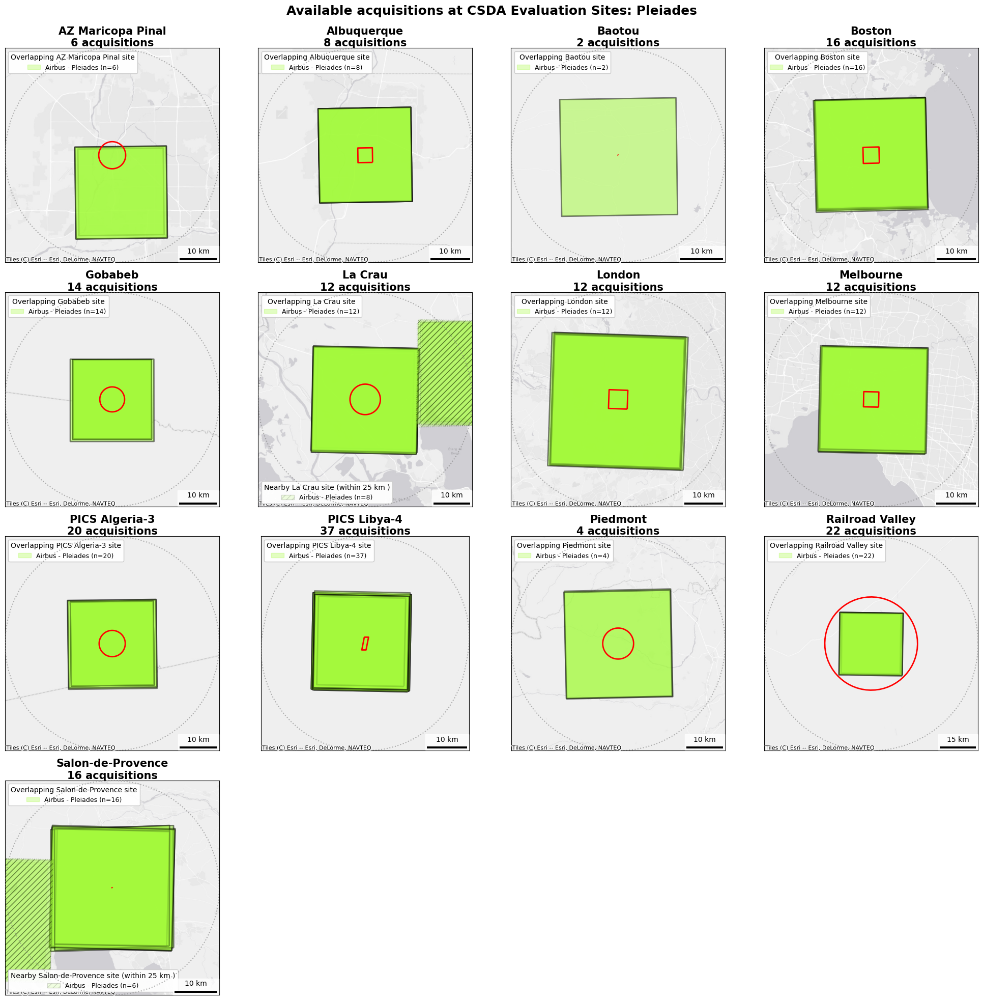

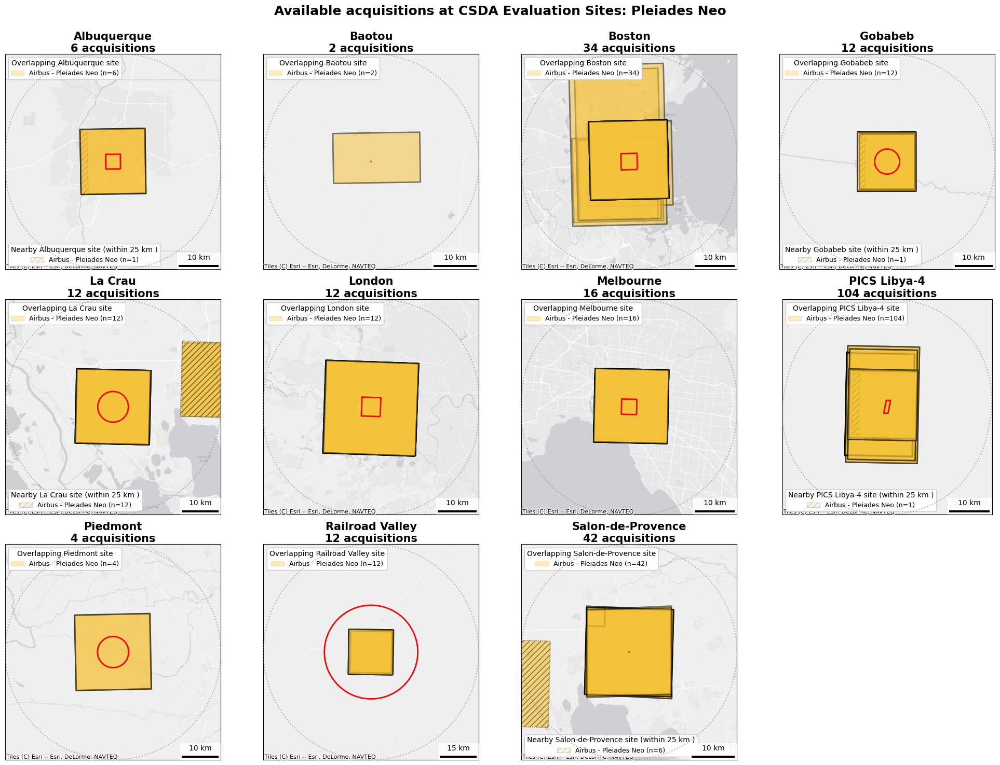

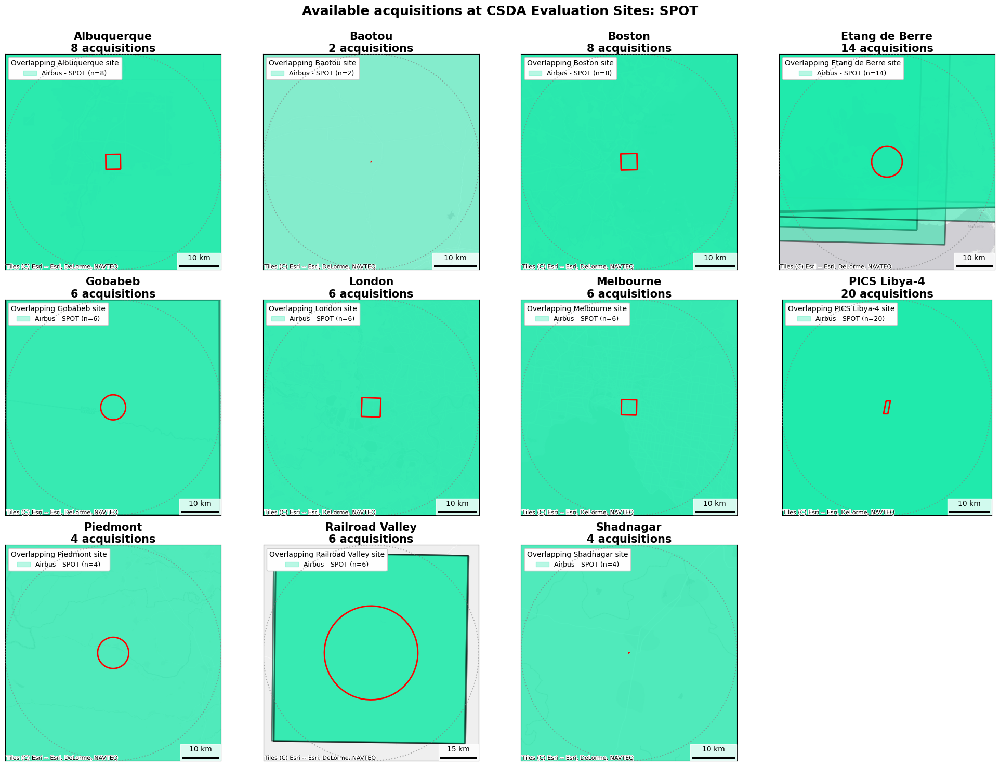

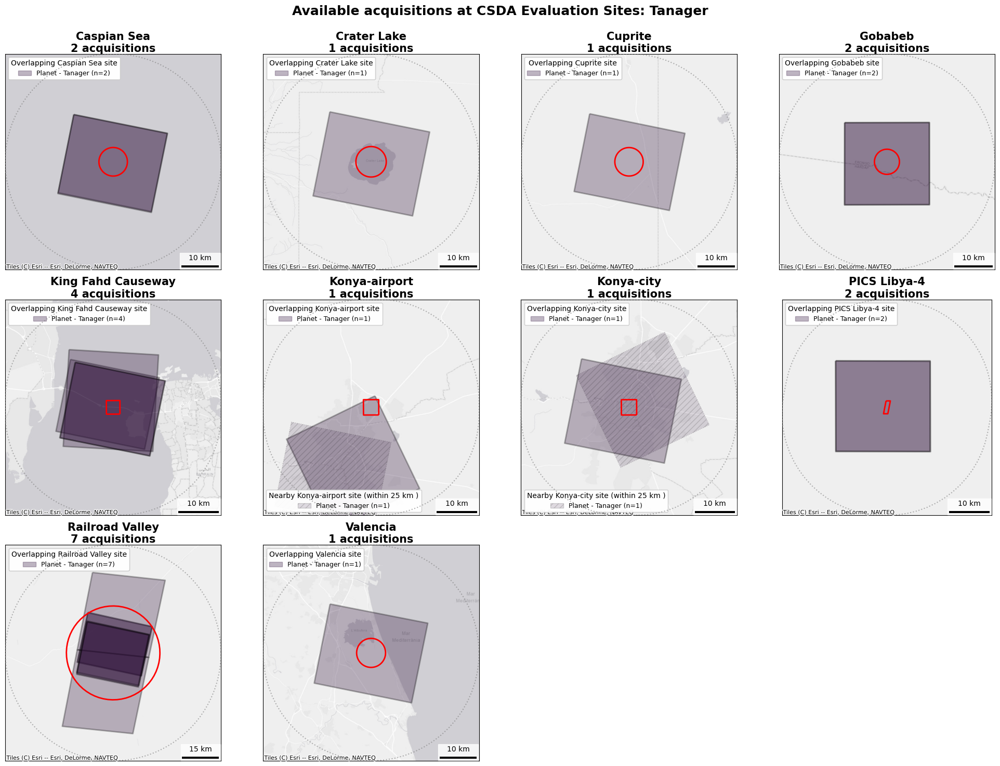

In [26]:
###### Site coverage maps for every constellation group present in the processed data.
# New constellation groups are discovered automatically from the constellation column.
coverage_data = footprint_gdf_acquisitions_sites.copy()
coverage_data = coverage_data[
    coverage_data['Site_Primary'].notna() & coverage_data['constellation'].notna()
].copy()

constellation_groups = sorted(coverage_data['constellation'].astype(str).unique())
print(f'constellation groups to plot: {", ".join(constellation_groups)}')

for constellation_name in constellation_groups:
    constellation_data = coverage_data[
        coverage_data['constellation'].astype(str).eq(constellation_name)
    ].copy()
    sites_to_plot = sorted(
        constellation_data.loc[
            constellation_data['Site_Primary'].ne('Not CSDA Eval Site'),
            'Site_Primary'
        ].dropna().unique()
    )
    if not sites_to_plot:
        print(f'No evaluation-site coverage for {constellation_name}; skipping')
        continue

    ncols = min(4, max(1, len(sites_to_plot)))
    nrows = (len(sites_to_plot) + ncols - 1) // ncols
    fig, axes = plt.subplots(
        nrows, ncols, figsize=(5 * ncols, 5 * nrows), squeeze=False
    )
    axes = axes.ravel()

    for axis, site_name in zip(axes, sites_to_plot):
        csdalib.plot_site_coverage(
            site_name,
            constellation_data,
            sites_gdf,
            BUF_KM_TOTAL_FOR_DISPLAY,
            sites_buf_gdf=sites_gdf_buf_display,
            ax=axis
        )

    for axis in axes[len(sites_to_plot):]:
        axis.set_visible(False)

    fig.suptitle(
        f'Available acquisitions at CSDA Evaluation Sites: {constellation_name}\n',
        fontsize=18, fontweight='bold'
    )
    #fig.tight_layout()
    plt.tight_layout()
    plt.show()

In [46]:
m = csdalib.make_CSDA_footprints_map(footprint_gdf_acquisitions_sites#[footprint_gdf_acquisitions_sites.image_type != 'PAN']#.drop('acquisition_datetime', axis=1).to_crs(4326)
                                 #, height='25%'
                                 , ACQS=True, site_name_col='sites'
                                 , MAP = sites_gdf.explore(style_kwds=dict(style_function=csdalib.dashed_style), name='Sites (actual)', 
                                                           m=sites_gdf_buf_display.explore(style_kwds=dict(style_function=csdalib.dashed_style), name='Sites (display)')),
                                 TOOLTIP_FIELDS_LIST = ['affiliation','constellation','sensor','acquisition_id','image_type'
                                                        ,'acquisition_datetime'
                                                       ]
                                )

In [47]:
m

### Make HTML for webmap of footprints

In [48]:
out_html = '/home/pmontesa/code/csda_summaries/notebooks/footprints_csda_map.html'

In [49]:
# Save to html

In [50]:
import os

# 1. Save the map as usual
m.save(out_html)

# 2. Build the header HTML (title + image + description)
header_html = """
    <!-- Outer card container -->
    <div style='padding: 28px 36px; font-family: -apple-system, BlinkMacSystemFont, "Segoe UI", Roboto, Arial, sans-serif; max-width: 1100px; margin: 24px auto; color: #222; background: #91bfdb; border: 1px solid #e0e6ee; border-radius: 10px; box-shadow: 0 2px 6px rgba(31, 77, 140, 0.06);'>
      
      <!-- Eyebrow tag -->
      <div style='display: inline-block; background: #fee090; color: #1f4d8c; padding: 4px 10px; border-radius: 4px; font-size: 0.78em; font-weight: 600; letter-spacing: 0.04em; text-transform: uppercase; margin-bottom: 10px;'>
        CSDA Evaluation Image Footprints
      </div>
      
      <!-- Title -->
      <h1 style='color: #1f4d8c; font-size: 1.85em; line-height: 1.25; margin: 0 0 6px 0; font-weight: 600;'>
        Interactive map of footprints of images available for CSDA SME Evaluations
      </h1>
      
      <!-- Subtitle/lede -->
      <p style='font-size: 1em; line-height: 1.55; margin: 6px 0 18px 0; color: #4a5568;'>
        These are imagery delivered in response to CSDA requests at sites from the <a href='https://docs.google.com/spreadsheets/d/13MrpqFtAOqQY9WdW9lHNsqjCbG-e3VQkEDbHOGIKa6k/edit?gid=538266839#gid=538266839' target='_blank' style='color: #1f4d8c; text-decoration: none; border-bottom: 2px solid #cfdcef;'>CSDA Evaluation Sites Database</a>.
      </p>
      
      <!-- Key features list -->
      <div style='background: #f6f9fd; border-left: 3px solid #1f4d8c; padding: 12px 16px; margin: 16px 0; border-radius: 0 4px 4px 0;'>
        <p style='margin: 0 0 8px 0; font-size: 0.95em; font-weight: 600; color: #1f4d8c;'>Each image footprint:</p>
        <ul style='margin: 0; padding-left: 20px; font-size: 0.95em; line-height: 1.55; color: #333;'>
          <li>is located at a CSDA Evaluation Site named using a unique identifier (<code style='background:#fff; padding:1px 5px; border-radius:3px; font-size:0.9em; border: 1px solid #e0e6ee;'>Site Name</code>)</li>
          <li>has geometric bounds representing the acauisition extent</li>
          <li>includes basic attributes associated with the image acquisition</li>
        </ul>
      </div>
      
      <!-- Display note -->
      <p style='font-size: 0.95em; line-height: 1.55; margin: 14px 0; color: #4a5568;'>
        Image footprint geometry should <b>completely cover</b> an site AOI. Mouse over footprints for acquisition details.
      </p>
      
      <!-- Footer row: status + contact -->
      <div style='display: flex; justify-content: space-between; align-items: center; margin-top: 18px; padding-top: 12px; border-top: 1px solid #e0e6ee; font-size: 0.85em; color: #718096;'>
        <span style='font-style: italic;'>Work in progress — some images were not properly footprinted and are missing from this map.</span>
        <span><b>Contact:</b> <a href='mailto:paul.m.montesano@nasa.gov' style='color: #1f4d8c; text-decoration: none;'>paul.m.montesano@nasa.gov</a></span>
      </div>
      
    </div>
"""


# 3. CSS to make the folium map fill the page width and a tall portion of the viewport
fullwidth_css = """
<style>
  body { margin: 0; padding: 0; }
  /* Folium map container — override fixed width/height */
  .folium-map {
    width: 100% !important;
    height: 45vh !important;
    max-width: 100% !important;
  }
  /* If folium wraps the map in a Figure div, also stretch it */
  div[id^="map_"] {
    width: 100% !important;
    height: 45vh !important;
  }
</style>
"""

# 4. Inject header + CSS right after <body>
with open(out_html, 'r') as f:
    html = f.read()

html = html.replace('<body>', f'<body>\n{fullwidth_css}\n{header_html}', 1)

with open(out_html, 'w') as f:
    f.write(html)

print(f"Saved {out_html} — push to GitHub to view at:")
print(f"  https://pahbs.github.io/maap_tools/maps/{out_html}")


Saved /home/pmontesa/code/csda_summaries/notebooks/footprints_csda_map.html — push to GitHub to view at:
  https://pahbs.github.io/maap_tools/maps//home/pmontesa/code/csda_summaries/notebooks/footprints_csda_map.html
